In [74]:
import numpy as np  
import pandas as pd  
import matplotlib.pyplot as plt  
import seaborn as sns  
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_selector
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    log_loss,
    classification_report
)

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
import pandas as pd
import numpy as np

In [4]:
pd.set_option('display.float_format', '{:,.2f}'.format)

In [5]:
import os
print(os.getcwd())

C:\Users\MiPotskhverashvili


In [6]:
df = pd.read_csv('Desktop/Python/Classification/train.csv')

In [7]:
pd.options.display.max_columns = 40
pd.options.display.max_rows = 28

In [8]:
df.head(2)

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,"1,824.84",3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7,11.27,4.00,_,809.98,26.82,22 Years and 1 Months,No,49.57,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",-1,NaN,11.27,4.00,Good,809.98,31.94,NaN,No,49.57,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good


In [9]:
df.dtypes

ID                           object
Customer_ID                  object
Month                        object
Name                         object
Age                          object
SSN                          object
Occupation                   object
Annual_Income                object
Monthly_Inhand_Salary       float64
Num_Bank_Accounts             int64
Num_Credit_Card               int64
Interest_Rate                 int64
Num_of_Loan                  object
Type_of_Loan                 object
Delay_from_due_date           int64
Num_of_Delayed_Payment       object
Changed_Credit_Limit         object
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt             object
Credit_Utilization_Ratio    float64
Credit_History_Age           object
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly      object
Payment_Behaviour            object
Monthly_Balance              object
Credit_Score                

## წავშალოთ _ სიმბოლოები ყველა სვეტიდან

In [10]:
# Remove underscores from string (object) values
for col in df.select_dtypes(include='object').columns:
    df[col] = df[col].str.replace('_', '', regex=False)

## გადავიყვანოთ რიცხობრივი სვეტები შესაბამის თაიფში

In [11]:
# List to store names of converted columns
converted_columns = []

# Loop through object-type columns
for col in df.select_dtypes(include='object').columns:
    try:
        # Try converting to float (will fail if any value cannot be converted)
        df[col] = df[col].astype(float)
        converted_columns.append(col)
    except ValueError:
        # Skip columns that can't be fully converted
        continue

# Final report
if converted_columns:
    print("✅ Converted the following columns to float:")
    for col in converted_columns:
        print(f"- {col}")
else:
    print("ℹ️ No object-type columns could be safely converted to float.")


✅ Converted the following columns to float:
- Age
- Annual_Income
- Num_of_Loan
- Num_of_Delayed_Payment
- Outstanding_Debt
- Amount_invested_monthly
- Monthly_Balance


In [12]:
df_work = df.copy()

In [13]:
df_work[df_work.select_dtypes(include='float').columns] = df_work.select_dtypes(include = 'float').astype('float32')

In [14]:
df_work[df_work.select_dtypes(include='int').columns] = df_work.select_dtypes(include = 'int').astype('int16')

## Float32 და Int16-ის დაყენებამ პრობლემები არ წარმოქმნა

In [15]:
for column in df_work.select_dtypes(include=['float32', 'int16', 'float', 'int']).columns:
    print(df_work[column].max() - df[column].max())
    print(df_work[column].min() - df[column].min())

0.0
0.0
0.0
0.0001757812497089617
0.00045572916860692203
-4.069009946761071e-07
0
0
0
0
0
0
0.0
0.0
0
0
0.0
0.0
0.0
0.0
-0.0001757812497089617
4.1723251242853365e-09
-7.105427357601002e-15
0.0
0.0
0.0
0.0
0.0
8.381498219023342e-06
3.838615063611048e+18


## გადავიყვანოთ ზოგი 

In [16]:
df_work['Age'] = df_work['Age'].astype('int16')

## Credit_History_Age გადავიყვანოთ რიცხობრივში

In [17]:
col = 'Credit_History_Age'

# Define a function to convert text to decimal years
def convert_age(val):
    if pd.isnull(val):
        return np.nan
    try:
        parts = val.strip().split()
        years = int(parts[0])
        months = int(parts[3])
        return round(years + months/12, 2)
    except:
        return np.nan

# Apply the conversion
df_work[col] = df_work[col].apply(convert_age)


In [18]:
df_work['Credit_History_Age'] = df_work['Credit_History_Age'].astype('float32')

## CustomerID Mapping

In [19]:
df_work['Customer_ID'] = df_work['Customer_ID'].astype('category').cat.codes

## Changed_Credit_Limit ცარიელი უჯრები 0-ებით შევცვალე

In [20]:
df_work['Changed_Credit_Limit'] = df_work['Changed_Credit_Limit'].replace('', 0)

In [21]:
df_work['Changed_Credit_Limit'] = df_work['Changed_Credit_Limit'].astype('float16')

## Category Type-ში გადავიდა სვეტები რომლებსაც 20-ზე ნაკლები უნიკალური მნიშვნელობა აქვთ

In [22]:
# Find all object columns
object_cols = df_work.select_dtypes(include='object').columns.tolist()

for col in object_cols:
    unique_count = df_work[col].nunique(dropna=True)
    if unique_count < 20:
        df_work[col] = df_work[col].astype('category')
        print(f"Column '{col}' converted to category (unique values: {unique_count})")


Column 'Month' converted to category (unique values: 8)
Column 'Occupation' converted to category (unique values: 16)
Column 'Credit_Mix' converted to category (unique values: 4)
Column 'Payment_of_Min_Amount' converted to category (unique values: 3)
Column 'Payment_Behaviour' converted to category (unique values: 7)
Column 'Credit_Score' converted to category (unique values: 3)


## SSN იგივე Social Security Number არანაირ ღირებულ ინფოს წარმოადგენს. შესაბამისად უბრალოდ დავწეროთ ვის აქვს ეს SSN და ვის არა

In [23]:
df_work['SSN'] = df_work['SSN'].apply(
    lambda x: 0 if x == '#F%$D@*&8' else 1
)

In [24]:
df_work['SSN'] = df_work['SSN'].astype('int16')

## წავშალეთ ID სვეტი

In [25]:
df_work = df_work.drop(['ID'], axis = 1)
df_work = df_work.drop(['Name'], axis = 1)

## Type_of_Loan სვეტში მნიშვნელობების დახარისხება

In [27]:
top_loans = df_work['Type_of_Loan'].value_counts().nlargest(100).index
mask = df_work['Type_of_Loan'].isin(top_loans)
count_top_100 = mask.sum()
print(f"Rows in top 100 loan types: {count_top_100}")

Rows in top 100 loan types: 27432


In [28]:
df_work['Type_of_Loan'] = df_work['Type_of_Loan'].apply(
    lambda x: x if x in top_loans else 'Other'
) 

In [29]:
df_work['Type_of_Loan'] = df_work['Type_of_Loan'].astype('category')

In [30]:
print(f"Total memory usage: {df.memory_usage(deep=True).sum() / 1024 ** 2:.2f} MB")
print(f"Total memory usage: {df_work.memory_usage(deep=True).sum() / 1024 ** 2:.2f} MB")

Total memory usage: 97.55 MB
Total memory usage: 6.41 MB


In [68]:
df_cleaned = df_work.copy()

In [32]:
df_cleaned.head(3)

,Customer_ID,Month,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,12320,January,23,1,Scientist,"19,114.12","1,824.84",3,4,3,4.00,Other,3,7.00,11.27,4.00,,809.98,26.82,22.08,No,49.57,80.42,HighspentSmallvaluepayments,312.49,Good
1,12320,February,23,1,Scientist,"19,114.12",NaN,3,4,3,4.00,Other,-1,NaN,11.27,4.00,Good,809.98,31.94,NaN,No,49.57,118.28,LowspentLargevaluepayments,284.63,Good
2,12320,March,-500,1,Scientist,"19,114.12",NaN,3,4,3,4.00,Other,3,7.00,0.00,4.00,Good,809.98,28.61,22.25,No,49.57,81.70,LowspentMediumvaluepayments,331.21,Good


In [33]:
df_cleaned.dtypes

Customer_ID                    int16
Month                       category
Age                            int16
SSN                            int16
Occupation                  category
Annual_Income                float32
Monthly_Inhand_Salary        float32
Num_Bank_Accounts              int16
Num_Credit_Card                int16
Interest_Rate                  int16
Num_of_Loan                  float32
Type_of_Loan                category
Delay_from_due_date            int16
Num_of_Delayed_Payment       float32
Changed_Credit_Limit         float16
Num_Credit_Inquiries         float32
Credit_Mix                  category
Outstanding_Debt             float32
Credit_Utilization_Ratio     float32
Credit_History_Age           float32
Payment_of_Min_Amount       category
Total_EMI_per_month          float32
Amount_invested_monthly      float32
Payment_Behaviour           category
Monthly_Balance              float32
Credit_Score                category
dtype: object

In [158]:
mapping = {
    'Standard': 0,
    'Poor': 1,
    'Good': 2
}

df_cleaned['Credit_Score_Mapped'] = df_cleaned['Credit_Score'].map(mapping)


In [66]:
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots
# import math

# # Step 1: Select numeric columns
# numeric_cols = df_cleaned.select_dtypes(include=['int', 'float']).columns.tolist()

# # Step 2: Compute rows and columns for subplots
# n_cols = 3  # you can adjust to e.g. 4
# n_plots = len(numeric_cols)
# n_rows = math.ceil(n_plots / n_cols)

# # Step 3: Create subplots
# fig = make_subplots(
#     rows=n_rows,
#     cols=n_cols,
#     subplot_titles=numeric_cols
# )

# # Step 4: Add traces
# row_idx, col_idx = 1, 1

# for col in numeric_cols:
#     fig.add_trace(
#         go.Histogram(
#             x=df_cleaned[col],
#             name=col
#         ),
#         row=row_idx,
#         col=col_idx
#     )
    
#     # Update grid position
#     col_idx += 1
#     if col_idx > n_cols:
#         col_idx = 1
#         row_idx += 1

# # Step 5: Update layout
# fig.update_layout(
#     template='plotly_dark',
#     height=n_rows * 300,
#     title_text='Distributions of Numeric Columns',
#     title_x=0.5,
#     showlegend=False
# )

# fig.show()


In [67]:
df_cleaned.describe()

,Customer_ID,Age,SSN,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,"100,000.00","100,000.00","100,000.00","100,000.00","84,998.00","100,000.00","100,000.00","100,000.00","100,000.00","100,000.00","92,998.00","100,000.00","98,035.00","100,000.00","100,000.00","90,970.00","100,000.00","95,521.00","97,132.00"
mean,"6,249.50",110.65,0.94,"176,415.70","4,194.17",17.09,22.47,72.47,3.01,21.07,30.92,NaN,27.75,"1,426.22",32.29,18.43,"1,403.12",637.41,"-30,885,801,086,297,359,515,648.00"
std,"3,608.46",686.24,0.23,"1,429,513.12","3,183.64",117.40,129.06,466.42,62.64,14.86,226.03,0.00,193.18,"1,155.13",5.12,8.31,"8,306.65","2,043.27",inf
min,0.00,-500.00,0.00,"7,005.93",303.65,-1.00,0.00,1.00,-100.00,-5.00,-3.00,-6.49,0.00,0.23,20.00,0.08,0.00,0.00,"-333,333,329,494,718,251,244,978,176.00"
25%,"3,124.75",24.00,1.00,"19,457.50","1,625.57",3.00,4.00,8.00,1.00,10.00,9.00,4.97,3.00,566.07,28.05,12.00,30.31,74.53,269.99
50%,"6,249.50",33.00,1.00,"37,578.61","3,093.75",6.00,5.00,13.00,3.00,18.00,14.00,9.25,6.00,"1,166.15",32.31,18.25,69.25,135.93,336.45
75%,"9,374.25",42.00,1.00,"72,790.92","5,957.45",7.00,7.00,20.00,5.00,28.00,18.00,14.66,9.00,"1,945.96",36.50,25.17,161.22,265.73,469.64
max,"12,499.00","8,698.00",1.00,"24,198,062.00","15,204.63","1,798.00","1,499.00","5,797.00","1,496.00",67.00,"4,397.00",36.97,"2,597.00","4,998.07",50.00,33.67,"82,331.00","10,000.00","1,602.04"


In [40]:
df_cleaned.select_dtypes(include = 'category').value_counts()

Month     Occupation  Type_of_Loan                     Credit_Mix  Payment_of_Min_Amount  Payment_Behaviour            Credit_Score
May                   Other                            Bad         Yes                    LowspentSmallvaluepayments   Poor            44
February              Other                            Standard    Yes                    LowspentSmallvaluepayments   Standard        38
January   Developer   Other                            Standard    Yes                    LowspentSmallvaluepayments   Standard        38
June                  Other                            Standard    Yes                    LowspentSmallvaluepayments   Standard        36
April     Journalist  Other                            Standard    Yes                    LowspentSmallvaluepayments   Standard        36
                                                                                                                                       ..
January   Accountant  Personal Loan     

In [558]:
df_cleaned[['Customer_ID','Num_Credit_Card']].loc[df_cleaned['Customer_ID'] == 959]

,Customer_ID,Num_Credit_Card
25008,959,3
25009,959,3
25010,959,3
25011,959,3
25012,959,3
25013,959,3
25014,959,3
25015,959,1499


In [556]:
# numeric_columns = df_cleaned.select_dtypes(include=['float', 'int']).columns.tolist()
# num_cols = 4
# num_rows = (len(numeric_columns) + num_cols - 1) // num_cols

# plt.figure(figsize=(20, num_rows * 5))

# # Plotting
# for i, col in enumerate(numeric_columns):
#     plt.subplot(num_rows, num_cols, i + 1)
#     sns.boxplot(x='Credit_Score_Mapped', y=col, data=df_cleaned, palette='Set3')
#     plt.title(f'Boxplot of {col} by Credit Score', fontsize=13, pad=10)
#     plt.xlabel('Credit_Score_Mapped', fontsize=13)
#     plt.ylabel(col, fontsize=13)
#     plt.xticks(fontsize=12)
#     plt.yticks(fontsize=12)

#     # Automatically adjust y-axis limits
#     # plt.ylim(df[col].min() - (df[col].max() - df[col].min()) * 0.1,
#     #          df[col].max() + (df[col].max() - df[col].min()) * 0.1)

# # Adjust horizontal (wspace) and vertical (hspace) spacing between subplots
# plt.subplots_adjust(wspace=0.4, hspace=0.7)

# plt.tight_layout()
# plt.show()


## Age Column Cleaning

In [530]:
# # Step 2: Correct Age per Customer_ID, allowing mode and mode + 1
# def fix_age_mode_plus_one(group):
#     mode_age = group['Age'].mode()
#     if not mode_age.empty:
#         base_age = mode_age.iloc[0]
#         allowed_ages = [base_age, base_age + 1]
#         # Replace any value not in allowed_ages with base_age
#         group['Age'] = group['Age'].apply(lambda x: base_age if x not in allowed_ages else x)
#     return group

# # Step 3: Apply the correction
# df_cleaned = df_cleaned.groupby('Customer_ID', group_keys=False).apply(fix_age_mode_plus_one)


In [531]:
# df_cleaned.loc[(df_cleaned['Age'] < 0) | (df_cleaned['Age'] > 100), 'Age']

Series([], Name: Age, dtype: int64)

## Null_ებისთვის

In [532]:
# # Step 1: Get all object (string) columns
# object_cols = df_cleaned.select_dtypes(include=['object', 'category']).columns.tolist()

# object_cols = [col for col in object_cols if col != "Month"]

# def fix_object_modes(group):
#     for col in object_cols:
#         valid_values = group[col].dropna()
#         if not valid_values.empty:
#             mode_val = valid_values.mode().iloc[0]
#             # Fill only NaNs, don't overwrite existing values
#             group[col] = group[col].fillna(mode_val)
#     return group

# df_cleaned = df_cleaned.groupby('Customer_ID', group_keys=False).apply(fix_object_modes)

In [69]:
numeric_cols = df_cleaned.select_dtypes(include=['category']).columns.tolist()
numeric_cols.pop(0)
numeric_cols

['Occupation',
 'Type_of_Loan',
 'Credit_Mix',
 'Payment_of_Min_Amount',
 'Payment_Behaviour',
 'Credit_Score']

In [70]:
%%time

def fix_categorical_modes(group):
    for col in numeric_cols:
        valid_values = group[col].dropna()
        if not valid_values.empty:
            mode_val = valid_values.mode().iloc[0]
            # Replace ALL non-null values with the mode
            group.loc[~group[col].isnull(), col] = mode_val
    return group

df_cleaned = df_cleaned.groupby('Customer_ID', group_keys=False).apply(fix_categorical_modes)


CPU times: total: 40.9 s
Wall time: 45.3 s


## Null_ებისთვის

In [524]:
# # Identify numeric columns
# numeric_cols = df_cleaned.select_dtypes(include=['int', 'float']).columns.tolist()

# def fill_nulls_with_group_mean(group):
#     for col in numeric_cols:
#         if group[col].isnull().any():
#             mean_val = group[col].mean(skipna=True)
#             group[col] = group[col].fillna(mean_val)
#     return group

# df_cleaned = df_cleaned.groupby('Customer_ID', group_keys=False).apply(fill_nulls_with_group_mean)


In [61]:
df_cleaned[numeric_cols]

,Customer_ID,Age,SSN,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
0,12320,23,1,"19,114.12","1,824.84",3,4,3,4.00,3,7.00,11.27,4.00,809.98,26.82,22.08,49.57,80.42,312.49
1,12320,23,1,"19,114.12",NaN,3,4,3,4.00,-1,NaN,11.27,4.00,809.98,31.94,NaN,49.57,118.28,284.63
2,12320,-500,1,"19,114.12",NaN,3,4,3,4.00,3,7.00,0.00,4.00,809.98,28.61,22.25,49.57,81.70,331.21
3,12320,23,1,"19,114.12",NaN,3,4,3,4.00,5,4.00,6.27,4.00,809.98,31.38,22.33,49.57,199.46,223.45
4,12320,23,1,"19,114.12","1,824.84",3,4,3,4.00,6,NaN,11.27,4.00,809.98,24.80,22.42,49.57,41.42,341.49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,8833,25,1,"39,628.99","3,359.42",4,6,7,2.00,23,7.00,11.50,3.00,502.38,34.66,31.50,35.10,60.97,NaN
99996,8833,25,1,"39,628.99","3,359.42",4,6,7,2.00,18,7.00,11.50,3.00,502.38,40.57,31.58,35.10,54.19,NaN
99997,8833,25,1,"39,628.99","3,359.42",4,6,5729,2.00,27,6.00,11.50,3.00,502.38,41.26,31.67,35.10,24.03,NaN
99998,8833,25,1,"39,628.99","3,359.42",4,6,7,2.00,20,NaN,11.50,3.00,502.38,33.64,31.75,35.10,251.67,NaN


In [71]:
numeric_cols = df_cleaned.select_dtypes(include=['number']).columns.tolist()
numeric_cols

['Customer_ID',
 'Age',
 'SSN',
 'Annual_Income',
 'Monthly_Inhand_Salary',
 'Num_Bank_Accounts',
 'Num_Credit_Card',
 'Interest_Rate',
 'Num_of_Loan',
 'Delay_from_due_date',
 'Num_of_Delayed_Payment',
 'Changed_Credit_Limit',
 'Num_Credit_Inquiries',
 'Outstanding_Debt',
 'Credit_Utilization_Ratio',
 'Credit_History_Age',
 'Total_EMI_per_month',
 'Amount_invested_monthly',
 'Monthly_Balance']

In [72]:
%%time
# Identify numeric columns
numeric_cols = df_cleaned.select_dtypes(include=['number']).columns.tolist()

def fix_numeric_modes(group):
    for col in numeric_cols:
        valid_values = group[col].dropna()
        if not valid_values.empty:
            mode_val = valid_values.mode().iloc[0]
            # Replace ALL non-null values with the mode
            group.loc[~group[col].isnull(), col] = mode_val
    return group

df_cleaned = df_cleaned.groupby('Customer_ID', group_keys=False).apply(fix_numeric_modes)


CPU times: total: 1min 32s
Wall time: 1min 44s


In [567]:
df_cleaned[['Customer_ID','Num_Credit_Card']].loc[df_cleaned2['Customer_ID'] == 959]

,Customer_ID,Num_Credit_Card
25008,959,3
25009,959,3
25010,959,3
25011,959,3
25012,959,3
25013,959,3
25014,959,3
25015,959,1499


In [578]:
df_cleaned2.dtypes

Customer_ID                    int16
Month                       category
Age                            int64
SSN                            int16
Occupation                  category
Annual_Income                float32
Monthly_Inhand_Salary        float32
Num_Bank_Accounts              int16
Num_Credit_Card                int16
Interest_Rate                  int16
Num_of_Loan                  float32
Type_of_Loan                category
Delay_from_due_date            int16
Num_of_Delayed_Payment       float32
Changed_Credit_Limit         float16
Num_Credit_Inquiries         float32
Credit_Mix                  category
Outstanding_Debt             float32
Credit_Utilization_Ratio     float32
Credit_History_Age           float32
Payment_of_Min_Amount       category
Total_EMI_per_month          float32
Amount_invested_monthly      float32
Payment_Behaviour           category
Monthly_Balance              float32
Credit_Score                category
Credit_Score_Mapped         category
d

In [628]:
df_cleaned2.describe()

,Customer_ID,Age,SSN,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,"59,750.00","59,750.00","59,750.00","59,750.00","50,865.00","59,750.00","59,750.00","59,750.00","59,750.00","59,750.00","55,545.00","59,750.00","58,557.00","59,750.00","59,750.00","54,252.00","59,750.00","56,846.00","58,359.00"
mean,"6,226.60",33.71,1.00,"37,324.78","3,109.02",5.06,5.25,13.26,3.04,17.56,12.57,inf,5.09,"1,107.25",25.10,19.47,64.15,49.30,225.53
std,"3,591.26",10.84,0.00,"25,054.68","2,092.68",2.46,1.94,8.06,2.10,10.79,5.80,5.26,3.50,748.32,1.78,7.70,57.06,27.08,66.15
min,1.00,14.00,1.00,"7,005.93",332.13,-1.00,0.00,1.00,0.00,-5.00,-2.00,-0.80,0.00,0.56,20.88,0.08,0.00,0.00,47.54
25%,"3,131.00",25.00,1.00,"18,060.64","1,516.72",3.00,4.00,7.00,2.00,9.00,9.00,5.42,2.00,506.06,23.77,14.25,22.34,28.79,187.62
50%,"6,196.50",33.00,1.00,"31,029.87","2,574.45",5.00,5.00,12.00,3.00,16.00,12.00,9.10,4.00,"1,029.00",24.88,19.08,48.25,43.95,231.44
75%,"9,317.00",42.00,1.00,"47,984.19","4,019.16",7.00,7.00,18.00,4.00,25.00,17.00,12.80,8.00,"1,465.87",26.20,25.75,89.25,64.44,265.02
max,"12,499.00",56.00,1.00,"121,966.28","10,073.25",10.00,11.00,34.00,9.00,50.00,27.00,25.59,15.00,"3,306.24",30.16,33.08,242.97,132.96,393.67


In [595]:
# df_cleaned2.loc[df_cleaned2['Monthly_Balance'] < 0, 'Monthly_Balance'] = np.nan

In [609]:
df_cleaned2['Total_EMI_per_month'].loc[df_cleaned2['Total_EMI_per_month'] == 0].count()

8079

In [637]:
df_cleaned.shape, df_cleaned2.shape, df_cleaned3.shape

((100000, 27), (59750, 27), (59750, 27))

In [638]:
df_cleaned3.isnull().sum().sum()

31236

In [641]:
numeric_cols = df_cleaned2.select_dtypes(include=['number']).columns.tolist()
(df_cleaned3[numeric_cols] < 0).sum()

Customer_ID                  0
Age                          0
SSN                          0
Annual_Income                0
Monthly_Inhand_Salary        0
Num_Bank_Accounts           16
Num_Credit_Card              0
Interest_Rate                0
Num_of_Loan                  0
Delay_from_due_date         24
Num_of_Delayed_Payment      57
Changed_Credit_Limit         8
Num_Credit_Inquiries         0
Outstanding_Debt             0
Credit_Utilization_Ratio     0
Credit_History_Age           0
Total_EMI_per_month          0
Amount_invested_monthly      0
Monthly_Balance              0
dtype: int64

In [644]:
df_cleaned3[['Customer_ID', 'Changed_Credit_Limit']].loc[df_cleaned3['Changed_Credit_Limit'] < 0]

,Customer_ID,Changed_Credit_Limit
2888,2990,-0.80
2889,2990,-0.80
2890,2990,-0.80
2891,2990,-0.80
2892,2990,-0.80
2893,2990,-0.80
2894,2990,-0.80
2895,2990,-0.80


In [432]:
# df_cleaned.loc[df_cleaned['Customer_ID'] == 2990]

In [447]:
# Merge x_train_final and y_train_final
train_combined = x_train_final.copy()
train_combined["Credit_Score"] = y_train_final

# Filter class 2 customers
train_class2 = train_combined[train_combined['Credit_Score'] == 2]

# Pick the first sample from class 2
sample = train_class2.iloc[0]

# Filter customers not in class 2
train_not2 = train_combined[train_combined['Credit_Score'] != 2]

# Select features only
features = train_combined.columns.drop('Credit_Score')

# Compute absolute differences
diffs = train_not2[features].subtract(sample[features]).abs()

# Total difference per customer
diffs['total_diff'] = diffs.sum(axis=1)

# Find top 10 similar customers
closest_idx = diffs.nsmallest(10, 'total_diff').index
closest_customers = train_not2.loc[closest_idx]

# Show Credit_Score of similar customers
print("Closest customers to chosen class 2 sample (but from other classes):")
print(closest_customers[['Credit_Score']])

# Optionally show full details
pd.set_option('display.max_columns', None)



Closest customers to chosen class 2 sample (but from other classes):
       Credit_Score
38272             0
38273             0
38278             0
30992             0
38277             0
38279             0
30993             0
30998             0
38275             0
6880              0


In [446]:
closest_customers

,Age,SSN,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Debt_Income_Ratio,Utilization_per_Card,Avg_EMI_per_Loan,Monthly_Savings,Delayed_Payment_Rate,Credit_History_per_Product,Investment_Rate,Payment_Burden,Balance_Ratio,Total_Accounts,Month_label,Occupation_label,Type_of_Loan_label,Credit_Mix_label,Payment_of_Min_Amount_label,Payment_Behaviour_label,Credit_Score
38272,-0.96,0.00,-0.35,-0.43,1.03,-0.24,0.06,-1.43,-0.67,-0.01,-0.95,-0.96,-0.60,-1.36,-0.16,-0.97,-0.32,0.27,-0.47,-0.31,-0.90,-0.39,-1.10,0.22,-0.19,-0.64,-0.06,0.55,-0.22,-0.68,0.30,0.96,-1.13,-0.62,0
38273,-0.96,0.00,-0.35,-0.43,1.03,-0.24,0.06,-1.43,-0.67,-0.54,-0.95,-0.96,-0.60,-1.36,-0.16,-0.97,-0.32,0.27,-0.47,-0.31,-0.90,-0.39,-1.10,0.22,-0.19,-0.64,-0.06,0.55,-0.65,-0.68,0.30,0.96,-1.13,-0.62,0
38278,-0.96,0.00,-0.35,-0.43,1.03,-0.24,0.06,-1.43,-0.67,-0.54,-0.95,-0.96,-0.60,-1.36,-0.16,-0.97,-0.32,0.27,-0.47,-0.31,-0.90,-0.39,-1.10,0.22,-0.19,-0.64,-0.06,0.55,0.22,-0.68,0.30,0.96,-1.13,-0.62,0
30992,-0.77,0.00,-0.51,-0.47,-0.13,-0.73,-0.97,-1.43,0.07,0.46,-1.49,-0.43,-0.55,0.75,1.01,-0.97,-0.47,0.60,-0.40,0.28,-0.90,-0.43,-1.10,1.43,-0.24,-0.62,0.13,-0.47,-0.22,-1.15,0.30,-0.11,-1.13,-0.62,0
38277,-0.96,0.00,-0.35,-0.43,1.03,-0.24,0.06,-1.43,-0.67,-0.54,-0.95,-0.96,-0.60,-1.36,-0.16,-0.97,-0.32,0.27,-0.47,-0.31,-0.90,-0.39,-1.10,0.22,-0.19,-0.64,-0.06,0.55,0.65,-0.68,0.30,0.96,-1.13,-0.62,0
38279,-0.96,0.00,-0.35,-0.43,1.03,-0.24,0.06,-1.43,-0.67,-0.54,-0.95,-0.96,-0.60,-1.36,-0.16,-0.97,-0.32,0.27,-0.47,-0.31,-0.90,-0.39,-1.10,0.22,-0.19,-0.64,-0.06,0.55,-1.09,-0.68,0.30,0.96,-1.13,-0.62,0
30993,-0.77,0.00,-0.51,-0.47,-0.13,-0.73,-0.97,-1.43,0.07,0.46,-1.49,-0.43,-0.55,0.75,1.01,-0.97,-0.47,0.60,-0.40,0.28,-0.90,-0.43,-1.10,1.43,-0.24,-0.62,0.13,-0.47,-0.65,-1.15,0.30,-0.11,-1.13,-0.62,0
30998,-0.77,0.00,-0.51,-0.47,-0.13,-0.73,-0.97,-1.43,0.07,0.46,-1.49,-0.43,-0.55,0.75,1.01,-0.97,-0.47,0.60,-0.40,0.28,-0.90,-0.43,-1.10,1.43,-0.24,-0.62,0.13,-0.47,0.22,-1.15,0.30,-0.11,-1.13,-0.62,0
38275,-0.96,0.00,-0.35,-0.43,1.03,-0.24,0.06,-1.43,-0.67,-0.54,-0.95,-0.96,-0.60,-1.36,-0.00,-0.97,-0.32,0.27,-0.47,-0.31,-0.90,-0.39,-1.10,0.32,-0.19,-0.64,-0.06,0.55,-1.53,-0.68,0.30,0.96,-1.13,-0.62,0
6880,0.62,0.00,-0.40,-0.52,0.64,0.24,-1.20,-1.43,0.48,0.79,-0.64,-0.70,-0.57,-0.17,1.39,-0.97,-0.56,0.53,-0.45,-0.39,-0.90,-0.48,-1.10,0.79,-0.33,-0.61,0.17,0.55,-0.22,-0.68,0.30,-0.11,-1.13,-0.62,0


In [440]:
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots
# import math

# # Step 1: Select numeric columns
# numeric_cols = df_cleaned.select_dtypes(include=['int', 'float']).columns.tolist()

# # Step 2: Compute rows and columns for subplots
# n_cols = 3  # you can adjust to e.g. 4
# n_plots = len(numeric_cols)
# n_rows = math.ceil(n_plots / n_cols)

# # Step 3: Create subplots
# fig = make_subplots(
#     rows=n_rows,
#     cols=n_cols,
#     subplot_titles=numeric_cols
# )

# # Step 4: Add traces
# row_idx, col_idx = 1, 1

# for col in numeric_cols:
#     fig.add_trace(
#         go.Histogram(
#             x=df_cleaned[col],
#             name=col
#         ),
#         row=row_idx,
#         col=col_idx
#     )
    
#     # Update grid position
#     col_idx += 1
#     if col_idx > n_cols:
#         col_idx = 1
#         row_idx += 1

# # Step 5: Update layout
# fig.update_layout(
#     template='plotly_dark',
#     height=n_rows * 300,
#     title_text='Distributions of Numeric Columns',
#     title_x=0.5,
#     showlegend=False
# )

# fig.show()


In [164]:
df_cleaned['Credit_Score_Mapped'] = df_cleaned['Credit_Score_Mapped'].astype(int)

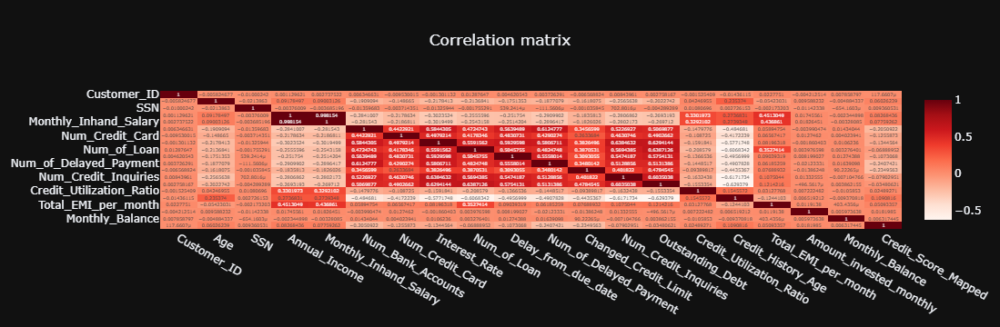

In [165]:
fig=px.imshow(df_cleaned.select_dtypes(include = 'number').corr(),text_auto=True, template='plotly_dark', color_continuous_scale=px.colors.sequential.Reds, 
              aspect='auto',title='Correlation matrix')

fig.update_layout(title_x=0.5)
fig.show()

In [64]:
for col in df_cleaned.select_dtypes(include = ['number']).columns:
    print(f"Column: {col}")
    print(df_cleaned[col].value_counts(dropna=False))
    print("-" * 50)


Column: Customer_ID
Customer_ID
12320    8
9350     8
4935     8
11721    8
3672     8
        ..
1953     8
6950     8
9460     8
11830    8
8833     8
Name: count, Length: 12500, dtype: int64
--------------------------------------------------
Column: Age
Age
38      2994
28      2968
31      2955
26      2945
32      2884
        ... 
1908       1
4583       1
7549       1
3119       1
1342       1
Name: count, Length: 1728, dtype: int64
--------------------------------------------------
Column: SSN
SSN
1    94428
0     5572
Name: count, dtype: int64
--------------------------------------------------
Column: Annual_Income
Annual_Income
17,816.75        16
22,434.16        16
40,341.16        16
17,273.83        16
109,945.32       16
                 ..
17,079,092.00     1
1,910,572.00      1
20,179,076.00     1
7,980,216.00      1
8,299,495.00      1
Name: count, Length: 13487, dtype: int64
--------------------------------------------------
Column: Monthly_Inhand_Salary
Monthly_Inha

In [63]:
for col in df_cleaned.select_dtypes(include = ['object', 'category']).columns:
    print(f"Column: {col}")
    print(df_cleaned[col].value_counts(dropna=False))
    print("-" * 50)


Column: Month
Month
April       12500
August      12500
February    12500
January     12500
July        12500
June        12500
March       12500
May         12500
Name: count, dtype: int64
--------------------------------------------------
Column: Occupation
Occupation
Lawyer          7096
Engineer        6840
Architect       6808
Mechanic        6776
Accountant      6744
Scientist       6744
Developer       6712
MediaManager    6696
Teacher         6656
Entrepreneur    6648
Doctor          6552
Journalist      6528
Manager         6408
Musician        6328
Writer          6304
                 160
Name: count, dtype: int64
--------------------------------------------------
Column: Type_of_Loan
Type_of_Loan
Other                                                              72568
Not Specified                                                       1408
Credit-Builder Loan                                                 1280
Personal Loan                                                  

In [265]:
# # Compute the dominant class per customer
# customer_targets = df_cleaned.groupby('Customer_ID')['Credit_Score'].agg(
#     lambda x: x.mode().iloc[0]
# ).reset_index()



# train_customers, test_customers = train_test_split(
#     customer_targets['Customer_ID'],
#     test_size=0.4,
#     random_state=42,
#     stratify=customer_targets['Credit_Score']
# )


# train_mask = df_cleaned['Customer_ID'].isin(train_customers)
# test_mask = df_cleaned['Customer_ID'].isin(test_customers)

# train_df = df_cleaned.loc[train_mask]
# test_df = df_cleaned.loc[test_mask]

# x_train = train_df.drop(['Credit_Score'], axis=1)
# y_train = train_df['Credit_Score']

# x_test = test_df.drop(['Credit_Score'], axis=1)
# y_test = test_df['Credit_Score']



In [266]:
# Get unique customer IDs
unique_customers = df_cleaned['Customer_ID'].unique()

# Split customer IDs
train_customers, test_customers = train_test_split(
    unique_customers,
    test_size=0.4,
    random_state=42
)


train_mask = df_cleaned['Customer_ID'].isin(train_customers)
test_mask = df_cleaned['Customer_ID'].isin(test_customers)

train_df = df_cleaned.loc[train_mask]
test_df = df_cleaned.loc[test_mask]


x_train = train_df.drop(['Credit_Score'], axis=1)
y_train = train_df['Credit_Score']

x_test = test_df.drop(['Credit_Score'], axis=1)
y_test = test_df['Credit_Score']



In [75]:
# x_train, x_test, y_train, y_test = train_test_split(df_cleaned.drop(['Credit_Score'],axis=1), 
#                                                     df_cleaned['Credit_Score'], test_size=0.3, random_state=42)

In [267]:
# Find unique customers in each set
train_customers = set(x_train['Customer_ID'].unique())
test_customers = set(x_test['Customer_ID'].unique())

overlap = train_customers.intersection(test_customers)
print(f"Customers appearing in BOTH train and test: {len(overlap)}")


Customers appearing in BOTH train and test: 0


In [268]:
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((60000, 26), (40000, 26), (60000,), (40000,))

In [269]:
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((60000, 26), (40000, 26), (60000,), (40000,))

In [270]:
x_train.isnull().sum()

Customer_ID                    0
Month                          0
Age                            0
SSN                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary       8974
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Type_of_Loan                   0
Delay_from_due_date            0
Num_of_Delayed_Payment      4171
Changed_Credit_Limit           0
Num_Credit_Inquiries        1202
Credit_Mix                     0
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Credit_History_Age          5362
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     2671
Payment_Behaviour              0
Monthly_Balance             1704
Credit_Score_Mapped            0
dtype: int64

In [271]:
x_train1 = x_train.copy()
x_test1 = x_test.copy()

float_cols = x_train.select_dtypes(include='number').columns

for col in float_cols:
    x_train1[col] = x_train[col].fillna(x_train[col].mean())
    x_test1[col] = x_test[col].fillna(x_train[col].mean())

In [272]:
x_train1.isnull().sum()

Customer_ID                 0
Month                       0
Age                         0
SSN                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Type_of_Loan                0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Payment_Behaviour           0
Monthly_Balance             0
Credit_Score_Mapped         0
dtype: int64

In [273]:
def get_outlier_bounds(series):
    q1 = series.quantile(0.05)
    q3 = series.quantile(0.95)
    iqr = q3 - q1
    return q1 - 1.5 * iqr, q3 + 1.5 * iqr

def remove_outliers_from_df(df, bounds_dict):
    df_filtered = df.copy()
    for col, (low, high) in bounds_dict.items():
        df_filtered = df_filtered[(df_filtered[col] >= low) | (df_filtered[col].isna())]
        df_filtered = df_filtered[(df_filtered[col] <= high) | (df_filtered[col].isna())]
    return df_filtered

In [274]:
# Calculate outlier bounds only from x_train
float_cols = x_train1.select_dtypes(include='number').columns
bounds = {col: get_outlier_bounds(x_train1[col]) for col in float_cols}

# Apply to x_train and x_test
x_train2 = remove_outliers_from_df(x_train1, bounds)
x_test2 = remove_outliers_from_df(x_test1, bounds)

y_train_final = y_train.loc[x_train2.index]
y_test_final = y_test.loc[x_test2.index]


In [275]:
y_train_final.value_counts(normalize = True)

Credit_Score
Standard   0.47
Poor       0.33
Good       0.20
Name: proportion, dtype: float64

In [276]:
x_train2.shape, x_test2.shape, y_train_final.shape, y_test_final.shape

((55431, 26), (37032, 26), (55431,), (37032,))

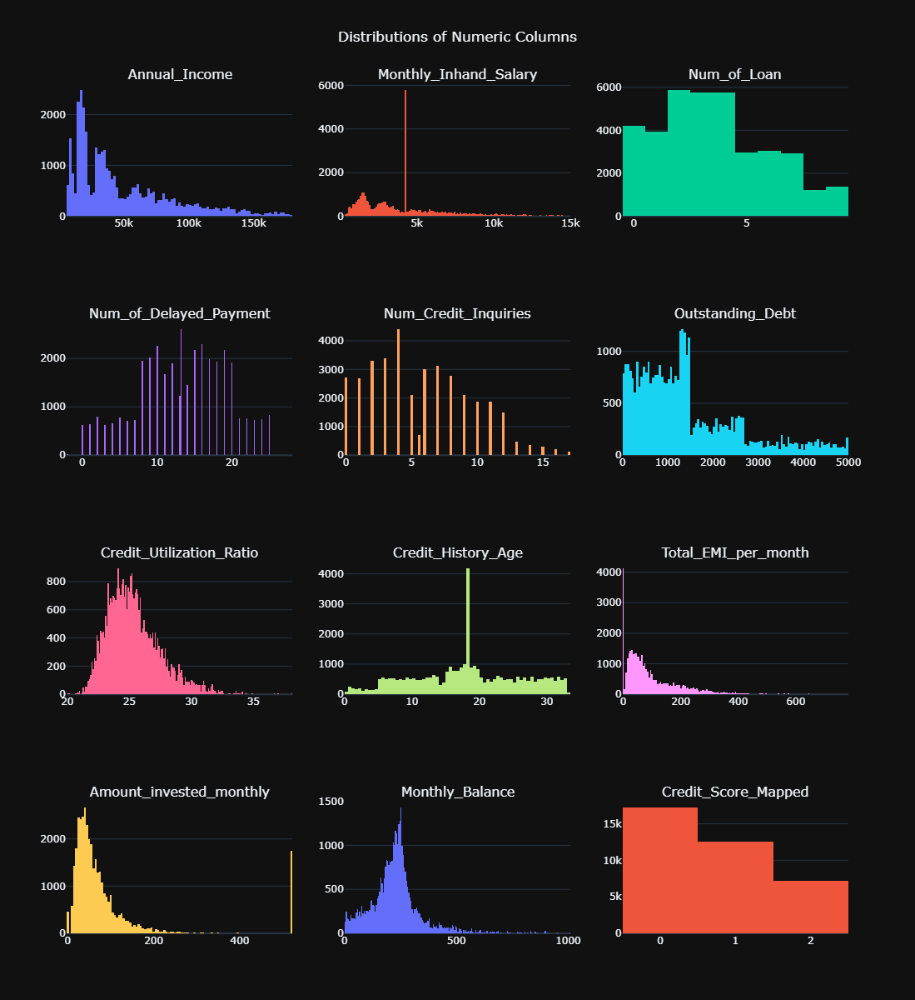

In [277]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import math

# Step 1: Select numeric columns
numeric_cols = x_test2.select_dtypes(include=['int', 'float']).columns.tolist()

# Step 2: Compute rows and columns for subplots
n_cols = 3  # you can adjust to e.g. 4
n_plots = len(numeric_cols)
n_rows = math.ceil(n_plots / n_cols)

# Step 3: Create subplots
fig = make_subplots(
    rows=n_rows,
    cols=n_cols,
    subplot_titles=numeric_cols
)

# Step 4: Add traces
row_idx, col_idx = 1, 1

for col in numeric_cols:
    fig.add_trace(
        go.Histogram(
            x=x_test2[col],
            name=col
        ),
        row=row_idx,
        col=col_idx
    )
    
    # Update grid position
    col_idx += 1
    if col_idx > n_cols:
        col_idx = 1
        row_idx += 1

# Step 5: Update layout
fig.update_layout(
    template='plotly_dark',
    height=n_rows * 300,
    title_text='Distributions of Numeric Columns',
    title_x=0.5,
    showlegend=False
)

fig.show()


In [278]:
x_train2.dtypes

Customer_ID                    int16
Month                       category
Age                            int16
SSN                            int16
Occupation                  category
Annual_Income                float32
Monthly_Inhand_Salary        float32
Num_Bank_Accounts              int16
Num_Credit_Card                int16
Interest_Rate                  int16
Num_of_Loan                  float32
Type_of_Loan                category
Delay_from_due_date            int16
Num_of_Delayed_Payment       float32
Changed_Credit_Limit         float16
Num_Credit_Inquiries         float32
Credit_Mix                  category
Outstanding_Debt             float32
Credit_Utilization_Ratio     float32
Credit_History_Age           float32
Payment_of_Min_Amount       category
Total_EMI_per_month          float32
Amount_invested_monthly      float32
Payment_Behaviour           category
Monthly_Balance              float32
Credit_Score_Mapped            int32
dtype: object

In [279]:
import numpy as np

def add_features(df):
    # Debt-to-Income Ratio
    df['Debt_Income_Ratio'] = np.where(
        df['Annual_Income'] > 0,
        df['Outstanding_Debt'] / df['Annual_Income'],
        0
    )
    
    # Utilization per Credit Card
    df['Utilization_per_Card'] = np.where(
        df['Num_Credit_Card'] > 0,
        df['Credit_Utilization_Ratio'] / df['Num_Credit_Card'],
        0
    )
    
    # Average EMI per Loan
    df['Avg_EMI_per_Loan'] = np.where(
        df['Num_of_Loan'] > 0,
        df['Total_EMI_per_month'] / df['Num_of_Loan'],
        0
    )
    
    # Monthly Savings
    df['Monthly_Savings'] = (
        df['Monthly_Inhand_Salary']
        - df['Total_EMI_per_month']
        - df['Amount_invested_monthly']
    )
    
    # Delayed Payment Rate
    df['Delayed_Payment_Rate'] = np.where(
        df['Num_of_Loan'] > 0,
        df['Num_of_Delayed_Payment'] / df['Num_of_Loan'],
        0
    )
    
    # Credit History per Credit Product
    df['Credit_History_per_Product'] = np.where(
        (df['Num_Credit_Card'] + df['Num_of_Loan']) > 0,
        df['Credit_History_Age'] / (df['Num_Credit_Card'] + df['Num_of_Loan']),
        0
    )
    
    # Investment Rate Relative to Income
    df['Investment_Rate'] = np.where(
        df['Annual_Income'] > 0,
        df['Amount_invested_monthly'] * 12 / df['Annual_Income'],
        0
    )
    
    # Payment Burden (annualized debt + monthly EMI) relative to salary
    df['Payment_Burden'] = np.where(
        df['Monthly_Inhand_Salary'] > 0,
        (df['Total_EMI_per_month'] + df['Outstanding_Debt']/12) / df['Monthly_Inhand_Salary'],
        0
    )
    
    # Monthly Balance Ratio
    df['Balance_Ratio'] = np.where(
        df['Monthly_Inhand_Salary'] > 0,
        df['Monthly_Balance'] / df['Monthly_Inhand_Salary'],
        0
    )
    
    # Total financial accounts
    df['Total_Accounts'] = (
        df['Num_Bank_Accounts'] + df['Num_Credit_Card']
    )
    
    return df


In [280]:
x_train3 = add_features(x_train2)
x_test3 = add_features(x_test2)

In [281]:
x_train3 = x_train3.dropna(axis=1)
x_test3 = x_test3.dropna(axis=1)

In [282]:
x_train3.shape, x_test3.shape, y_train_final.shape, y_test_final.shape

((55431, 36), (37032, 36), (55431,), (37032,))

In [283]:
y_test_final.value_counts()

Credit_Score
Standard    17284
Poor        12580
Good         7168
Name: count, dtype: int64

In [284]:
label_encoder = LabelEncoder()

In [285]:
x_train4 = x_train3.copy()
x_test4 = x_test3.copy()

category_cols = x_test4.select_dtypes(include = 'category').columns.tolist()

for col in category_cols:
    x_train4[col + '_label'] = label_encoder.fit_transform(x_train3[col])
    x_test4[col + '_label'] = label_encoder.transform(x_test3[col])

    x_train4.drop([col],axis=1,inplace=True)
    x_test4.drop([col],axis=1,inplace=True)

In [286]:
y_train_final = label_encoder.fit_transform(y_train_final)
y_test_final = label_encoder.fit_transform(y_test_final)

In [287]:
unique_values, counts = np.unique(y_train_final, return_counts=True)

# Print the results
print("Unique values:", unique_values)
print("Counts:", counts)

# You can also iterate and display them together
for value, count in zip(unique_values, counts):
    print(f"{value} occurs {count} times")


Unique values: [0 1 2]
Counts: [11184 18160 26087]
0 occurs 11184 times
1 occurs 18160 times
2 occurs 26087 times


In [288]:
x_train4.head(1)

,Customer_ID,Age,SSN,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score_Mapped,Debt_Income_Ratio,Utilization_per_Card,Avg_EMI_per_Loan,Monthly_Savings,Delayed_Payment_Rate,Credit_History_per_Product,Investment_Rate,Payment_Burden,Balance_Ratio,Total_Accounts,Month_label,Occupation_label,Type_of_Loan_label,Credit_Mix_label,Payment_of_Min_Amount_label,Payment_Behaviour_label
8,1066,28,1,"34,847.84","3,037.99",2,4,6,1.00,3,4.00,5.42,2.00,605.03,24.46,26.58,18.82,40.39,356.08,2,0.02,6.12,18.82,"2,978.78",4.00,5.32,0.01,0.02,0.12,6,3,14,11,2,1,1


In [289]:
x_train4.shape, x_test4.shape, y_train_final.shape, y_test_final.shape

((55431, 36), (37032, 36), (55431,), (37032,))

In [290]:
standart = StandardScaler()

In [291]:
columns = x_train4.columns

In [292]:
x_train_final = standart.fit_transform(x_train4)
x_train_final = pd.DataFrame(x_train_final, columns=columns, index=x_train4.index)

In [293]:
x_test_final = standart.transform(x_test4)
x_test_final = pd.DataFrame(x_test_final, columns=columns, index=x_test4.index)

In [294]:
x_train_final.shape, x_test_final.shape, y_train_final.shape, y_test_final.shape

((55431, 36), (37032, 36), (55431,), (37032,))

In [295]:
x_train_final.head(1)

,Customer_ID,Age,SSN,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score_Mapped,Debt_Income_Ratio,Utilization_per_Card,Avg_EMI_per_Loan,Monthly_Savings,Delayed_Payment_Rate,Credit_History_per_Product,Investment_Rate,Payment_Burden,Balance_Ratio,Total_Accounts,Month_label,Occupation_label,Type_of_Loan_label,Credit_Mix_label,Payment_of_Min_Amount_label,Payment_Behaviour_label
8,-1.45,-0.49,0.00,-0.40,-0.39,-1.29,-0.73,-0.97,-1.02,-1.21,-1.54,-0.76,-0.96,-0.70,-0.46,1.06,-0.78,-0.41,1.10,1.64,-0.50,0.11,-0.30,-0.35,-0.01,0.96,-0.24,-0.62,0.25,-1.22,-0.22,1.42,-2.96,-0.11,-1.13,-1.08


In [296]:
x_train_final = x_train_final.drop('Customer_ID', axis = 1)
x_test_final = x_test_final.drop('Customer_ID', axis = 1)

x_train_final = x_train_final.drop('Credit_Score_Mapped', axis = 1)
x_test_final = x_test_final.drop('Credit_Score_Mapped', axis = 1)

In [297]:
x_train_final.shape, x_test_final.shape, y_train_final.shape, y_test_final.shape

((55431, 34), (37032, 34), (55431,), (37032,))

In [298]:
models = {
    # 'Logistic Regression': LogisticRegression(
    #     multi_class='multinomial',
    #     solver='lbfgs',
    #     max_iter=1000,
    #     random_state=42
    # ),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42)
}

results = []

for name, model in models.items():
    # Fit the model
    model.fit(x_train_final, y_train_final)
    
    # Predict labels
    y_pred = model.predict(x_test_final)
    
    # Predict probabilities for log loss
    y_probs = model.predict_proba(x_test_final)
    
    # Calculate metrics
    acc = accuracy_score(y_test_final, y_pred)
    precision = precision_score(y_test_final, y_pred, average='macro', zero_division=0)
    recall = recall_score(y_test_final, y_pred, average='macro', zero_division=0)
    f1 = f1_score(y_test_final, y_pred, average='macro', zero_division=0)
    logloss = log_loss(y_test_final, y_probs)
    
    print(f"=== {name} ===")
    print("Accuracy:", round(acc, 4))
    print("Precision (macro):", round(precision, 4))
    print("Recall (macro):", round(recall, 4))
    print("F1-score (macro):", round(f1, 4))
    print("Log Loss:", round(logloss, 4))
    print("\nClassification Report:\n", classification_report(y_test_final, y_pred))
    
    results.append({
        'Model': name,
        'Accuracy': acc,
        'Precision (macro)': precision,
        'Recall (macro)': recall,
        'F1-score (macro)': f1,
        'Log Loss': logloss
    })
    
# Convert results to DataFrame for easier comparison
results_df = pd.DataFrame(results)
print(results_df)


=== Decision Tree ===
Accuracy: 0.6446
Precision (macro): 0.6253
Recall (macro): 0.6281
F1-score (macro): 0.6267
Log Loss: 12.8117

Classification Report:
               precision    recall  f1-score   support

           0       0.53      0.55      0.54      7168
           1       0.67      0.67      0.67     12580
           2       0.68      0.66      0.67     17284

    accuracy                           0.64     37032
   macro avg       0.63      0.63      0.63     37032
weighted avg       0.65      0.64      0.64     37032

=== Random Forest ===
Accuracy: 0.7525
Precision (macro): 0.7377
Recall (macro): 0.7556
F1-score (macro): 0.7443
Log Loss: 0.666

Classification Report:
               precision    recall  f1-score   support

           0       0.64      0.77      0.70      7168
           1       0.79      0.75      0.77     12580
           2       0.79      0.75      0.77     17284

    accuracy                           0.75     37032
   macro avg       0.74      0.76    

In [299]:
overlap = x_train_final.merge(x_test_final, how='inner')
print("Overlapping rows:", len(overlap))


Overlapping rows: 0


In [300]:
# Combine train features and target
train_data = x_train_final.copy()
train_data['target'] = y_train_final

# Compute correlations
corrs = train_data.corr(numeric_only=True)['target'].abs().sort_values(ascending=False)
print(corrs)


target                        1.00
Payment_of_Min_Amount_label   0.31
Credit_Mix_label              0.25
Utilization_per_Card          0.24
Num_of_Delayed_Payment        0.24
                              ... 
Occupation_label              0.01
Investment_Rate               0.01
Type_of_Loan_label            0.00
Month_label                   0.00
SSN                            NaN
Name: target, Length: 35, dtype: float64


In [301]:
rf = RandomForestClassifier(random_state=42)
rf.fit(x_train_final, y_train_final)

importances = pd.Series(rf.feature_importances_, index=x_train_final.columns)
print(importances.sort_values(ascending=False))


Outstanding_Debt          0.10
Credit_Mix_label          0.08
Interest_Rate             0.08
Delay_from_due_date       0.05
Changed_Credit_Limit      0.05
                          ... 
Monthly_Savings           0.01
Payment_Behaviour_label   0.01
Type_of_Loan_label        0.01
Month_label               0.00
SSN                       0.00
Length: 34, dtype: float64


In [178]:
x_train_final.head(1)

,Age,SSN,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Debt_Income_Ratio,Utilization_per_Card,Avg_EMI_per_Loan,Monthly_Savings,Delayed_Payment_Rate,Credit_History_per_Product,Investment_Rate,Payment_Burden,Balance_Ratio,Total_Accounts,Month_label,Occupation_label,Type_of_Loan_label,Credit_Mix_label,Payment_of_Min_Amount_label,Payment_Behaviour_label
76513,-1.05,0.00,2.70,3.00,-0.91,0.72,-0.40,-0.21,-0.95,-0.21,-0.91,-0.70,-0.92,-0.24,1.49,1.21,0.33,2.91,-0.67,-0.56,1.48,3.01,-0.00,0.08,-0.31,-0.64,-0.55,-0.22,-0.66,0.25,0.30,-0.10,-1.14,-1.09


In [307]:
from sklearn.feature_selection import SelectKBest, f_classif

selector = SelectKBest(score_func=f_classif, k=20)
x_train_new = selector.fit_transform(x_train_final, y_train_final)
x_test_new = selector.transform(x_test_final)


In [305]:
x_train_final.shape, x_new.shape

((55431, 34), (55431, 20))

In [310]:
model = RandomForestClassifier(random_state=42)
model.fit(x_train_new, y_train_final)

y_pred = model.predict(x_test_new)
acc = accuracy_score(y_test_final, y_pred)

print("Accuracy:", acc)


Accuracy: 0.7509181248649817


In [309]:
# Boolean mask of selected features
mask = selector.get_support()

# Selected feature names
selected_features = x_train_final.columns[mask]
print(selected_features)


Index(['Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_History_Age',
       'Debt_Income_Ratio', 'Utilization_per_Card', 'Monthly_Savings',
       'Credit_History_per_Product', 'Payment_Burden', 'Total_Accounts',
       'Credit_Mix_label', 'Payment_of_Min_Amount_label'],
      dtype='object')


In [375]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

pipeline = Pipeline([
    ('select', SelectKBest(score_func=f_classif)),
    ('clf', RandomForestClassifier(random_state=42))
])

param_grid = {
    'select__k': [5, 10, 20, 25, 30, 34]
}

grid = GridSearchCV(
    pipeline,
    param_grid,
    scoring='accuracy',
    cv=10,
    verbose=1,
    n_jobs=-1
)

grid.fit(x_train_final, y_train_final)

print("Best k:", grid.best_params_)
print("Best macro Accuracy:", grid.best_score_)


Fitting 10 folds for each of 6 candidates, totalling 60 fits
Best k: {'select__k': 30}
Best macro Accuracy: 0.7469829053921604


In [376]:
selector = grid.best_estimator_.named_steps['select']
mask = selector.get_support()
selected_features_Forest = x_train_final.columns[mask].tolist()

In [377]:
selected_features_Forest

['Age',
 'Annual_Income',
 'Monthly_Inhand_Salary',
 'Num_Bank_Accounts',
 'Num_Credit_Card',
 'Interest_Rate',
 'Num_of_Loan',
 'Delay_from_due_date',
 'Num_of_Delayed_Payment',
 'Changed_Credit_Limit',
 'Num_Credit_Inquiries',
 'Outstanding_Debt',
 'Credit_Utilization_Ratio',
 'Credit_History_Age',
 'Total_EMI_per_month',
 'Amount_invested_monthly',
 'Monthly_Balance',
 'Debt_Income_Ratio',
 'Utilization_per_Card',
 'Avg_EMI_per_Loan',
 'Monthly_Savings',
 'Delayed_Payment_Rate',
 'Credit_History_per_Product',
 'Payment_Burden',
 'Balance_Ratio',
 'Total_Accounts',
 'Type_of_Loan_label',
 'Credit_Mix_label',
 'Payment_of_Min_Amount_label',
 'Payment_Behaviour_label']

In [356]:
from sklearn.model_selection import ParameterGrid, cross_val_score
from sklearn.metrics import make_scorer, precision_score
from tqdm import tqdm


In [369]:
param_grid = {
    'criterion': ['gini'],
    'max_depth': [None],
    'min_samples_split': [2, 3, 4],
    'min_samples_leaf': [2, 3, 4, 5],
    'min_weight_fraction_leaf': [0, 0.001, 0.01],
    'max_features': [1, 'sqrt'],
    'max_leaf_nodes': [None, 2],
    'min_impurity_decrease': [0.0, 0.1, 1],
}

grid_list = list(ParameterGrid(param_grid))
print(f"Total parameter combinations: {len(grid_list)}")


Total parameter combinations: 432


In [370]:
results = []

# Define precision scorer
scorer = make_scorer(precision_score, average='macro', zero_division=0)

for params in tqdm(grid_list, desc="Grid Search Progress"):
    # Create the model
    model = RandomForestClassifier(
        **params,
        n_jobs=-1,           # keep using all CPUs
        random_state=42      # for reproducibility
    )
    
    # Run cross-validation
    scores = cross_val_score(
        model,
        x_train_final,
        y_train_final,
        scoring=scorer,
        cv=3,
        n_jobs=-1
    )
    
    mean_score = np.mean(scores)
    
    # Store results
    result_row = params.copy()
    result_row['mean_precision'] = mean_score
    results.append(result_row)


Grid Search Progress: 100%|██████████████████████████████████████████████████████████| 432/432 [10:48<00:00,  1.50s/it]


In [371]:
results_df = pd.DataFrame(results)
best_idx = results_df['mean_precision'].idxmax()
best_params = results_df.loc[best_idx]

print("Best Params:")
print(best_params)

Best Params:
criterion                   gini
max_depth                   None
max_features                sqrt
max_leaf_nodes               NaN
min_impurity_decrease       0.00
min_samples_leaf               2
min_samples_split              2
min_weight_fraction_leaf    0.00
mean_precision              0.73
Name: 217, dtype: object


In [372]:
# Clean parameters
best_params_cleaned = {
    'criterion': 'gini',
    'max_depth': None,
    'max_features': 'sqrt',
    'max_leaf_nodes': None,
    'min_impurity_decrease': 0.0,
    'min_samples_leaf': 2,
    'min_samples_split': 2,
    'min_weight_fraction_leaf': 0.00,
    'n_jobs': -1,
    'random_state': 42
}

# Build and fit model
rf_best = RandomForestClassifier(**best_params_cleaned)
rf_best.fit(x_train_final[selected_features_Forest], y_train_final)

# Predict
y_pred = rf_best.predict(x_test_final[selected_features_Forest])
y_prob = rf_best.predict_proba(x_test_final[selected_features_Forest])

# Metrics
accuracy = accuracy_score(y_test_final, y_pred)
precision = precision_score(y_test_final, y_pred, average='macro', zero_division=0)
recall = recall_score(y_test_final, y_pred, average='macro', zero_division=0)
f1 = f1_score(y_test_final, y_pred, average='macro', zero_division=0)
ll = log_loss(y_test_final, y_prob)

print(f"=== Random Forest ===")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision (macro): {precision:.4f}")
print(f"Recall (macro): {recall:.4f}")
print(f"F1-score (macro): {f1:.4f}")
print(f"Log Loss: {ll:.4f}")
print("\nClassification Report:\n")
print(classification_report(y_test_final, y_pred, digits=4))

# Store in dataframe
results_df = pd.DataFrame([{
    'Model': 'Random Forest',
    'Accuracy': accuracy,
    'Precision (macro)': precision,
    'Recall (macro)': recall,
    'F1-score (macro)': f1,
    'Log Loss': ll
}])

print(results_df)


=== Random Forest ===
Accuracy: 0.6394
Precision (macro): 0.6239
Recall (macro): 0.6243
F1-score (macro): 0.6241
Log Loss: 1.9061

Classification Report:

              precision    recall  f1-score   support

           0     0.5481    0.5472    0.5476      7168
           1     0.6649    0.6714    0.6681     12580
           2     0.6587    0.6545    0.6566     17284

    accuracy                         0.6394     37032
   macro avg     0.6239    0.6243    0.6241     37032
weighted avg     0.6394    0.6394    0.6394     37032

           Model  Accuracy  Precision (macro)  Recall (macro)  \
0  Random Forest      0.64               0.62            0.62   

   F1-score (macro)  Log Loss  
0              0.62      1.91  


Confusion Matrix:
 [[ 3922   631  2615]
 [  888  8446  3246]
 [ 2346  3626 11312]]


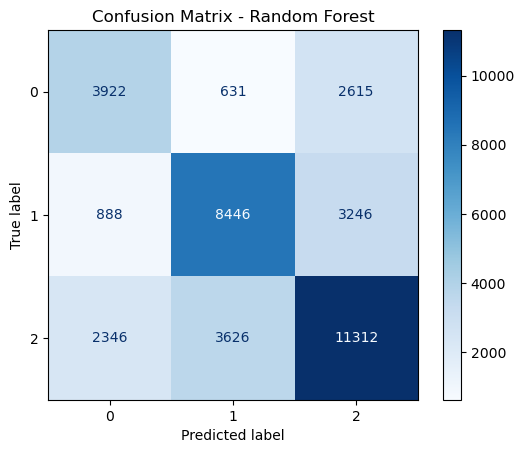

In [374]:
# from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# import matplotlib.pyplot as plt

# Compute confusion matrix
cm = confusion_matrix(y_test_final, y_pred)

# Print matrix
print("Confusion Matrix:\n", cm)

# Plot
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1, 2])
disp.plot(cmap='Blues')
plt.title("Confusion Matrix - Random Forest")
plt.show()


In [424]:
precision_0_scorer = make_scorer(
    precision_score,
    pos_label=0,
    average='binary',
    zero_division=0
)


In [429]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'criterion': ['gini'],
    'max_depth': [None], # 2
    'min_samples_split': [4], # 2
    'min_samples_leaf': [3], # 1, 5
    'min_weight_fraction_leaf': [0],
    'max_features': ['sqrt'], # 1
    'max_leaf_nodes': [None],  #1, 2
    'min_impurity_decrease': [0.0],
    # 'bootstrap': [True],
    # 'oob_score': False,
    'n_jobs': [-1],
    # 'random_state': None,
    # 'verbose': 0,
    # 'warm_start': False,
    # 'class_weight': [{0: 20, 1: 20, 2: 5}],
    # 'ccp_alpha': 0.0,
    # 'max_samples': None
}

grid = GridSearchCV(
    RandomForestClassifier(),
    param_grid,
    scoring=precision_0_scorer,
    cv=3,
    verbose=1,
    n_jobs=-1
)
grid.fit(x_train_final[selected_features_Forest], y_train_final)


Fitting 3 folds for each of 1 candidates, totalling 3 fits


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [None],
                         'max_features': ['sqrt'], 'max_leaf_nodes': [None],
                         'min_impurity_decrease': [0.0],
                         'min_samples_leaf': [3], 'min_samples_split': [4],
                         'min_weight_fraction_leaf': [0], 'n_jobs': [-1]},
             scoring=make_scorer(precision_score, pos_label=2, average=binary, zero_division=0),
             verbose=1)

In [397]:
print(grid.best_params_)
print("Best macro Accuracy:", grid.best_score_)

{'class_weight': {0: 99, 1: 1, 2: 1}, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 3, 'min_samples_split': 4, 'min_weight_fraction_leaf': 0, 'n_jobs': -1}
Best macro Accuracy: nan


In [421]:
models = {
    'Random Forest': RandomForestClassifier(random_state=42)
}

results = []

y_pred = grid.best_estimator_.predict(x_test_final[selected_features_Forest])

# Predict probabilities for log loss
y_probs = grid.predict_proba(x_test_final[selected_features_Forest])

# Calculate metrics
acc = accuracy_score(y_test_final, y_pred)
precision = precision_score(y_test_final, y_pred, average='macro', zero_division=0)
recall = recall_score(y_test_final, y_pred, average='macro', zero_division=0)
f1 = f1_score(y_test_final, y_pred, average='macro', zero_division=0)
logloss = log_loss(y_test_final, y_probs)


print("Accuracy:", round(acc, 4))
print("Precision (macro):", round(precision, 4))
print("Recall (macro):", round(recall, 4))
print("F1-score (macro):", round(f1, 4))
print("Log Loss:", round(logloss, 4))
print("\nClassification Report:\n", classification_report(y_test_final, y_pred))

results.append({
    'Model': 'RandomForest',
    'Accuracy': acc,
    'Precision (macro)': precision,
    'Recall (macro)': recall,
    'F1-score (macro)': f1,
    'Log Loss': logloss
})

# Convert results to DataFrame for easier comparison
results_df = pd.DataFrame(results)
print(results_df)

Accuracy: 0.7532
Precision (macro): 0.7385
Recall (macro): 0.7558
F1-score (macro): 0.7447
Log Loss: 0.6393

Classification Report:
               precision    recall  f1-score   support

           0       0.64      0.77      0.70      7168
           1       0.79      0.75      0.77     12580
           2       0.79      0.75      0.77     17284

    accuracy                           0.75     37032
   macro avg       0.74      0.76      0.74     37032
weighted avg       0.76      0.75      0.75     37032

          Model  Accuracy  Precision (macro)  Recall (macro)  \
0  RandomForest      0.75               0.74            0.76   

   F1-score (macro)  Log Loss  
0              0.74      0.64  


Confusion Matrix:
 [[ 5489   286  1393]
 [  998  9347  2235]
 [ 2038  2148 13098]]


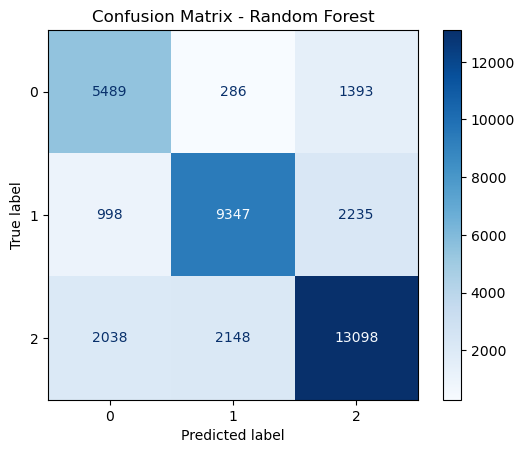

In [430]:
# from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# import matplotlib.pyplot as plt
y_pred = grid.best_estimator_.predict(x_test_final[selected_features_Forest])

# Compute confusion matrix
cm = confusion_matrix(y_test_final, y_pred)

# Print matrix
print("Confusion Matrix:\n", cm)

# Plot
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1, 2])
disp.plot(cmap='Blues')
plt.title("Confusion Matrix - Random Forest")
plt.show()


In [453]:
# pip uninstall tensorflow tensorflow-cpu tensorflow-gpu -y
# pip install tensorflow

SyntaxError: invalid syntax (858651293.py, line 1)

In [454]:
import tensorflow as tf
print(tf.__version__)


ImportError: Traceback (most recent call last):
  File "C:\Users\MiPotskhverashvili\AppData\Roaming\Python\Python311\site-packages\tensorflow\python\pywrap_tensorflow.py", line 73, in <module>
    from tensorflow.python._pywrap_tensorflow_internal import *
ImportError: DLL load failed while importing _pywrap_tensorflow_internal: Access is denied.


Failed to load the native TensorFlow runtime.
See https://www.tensorflow.org/install/errors for some common causes and solutions.
If you need help, create an issue at https://github.com/tensorflow/tensorflow/issues and include the entire stack trace above this error message.

In [450]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

model = Sequential()

# Input layer
model.add(Dense(64, input_dim=x_train_final.shape[1], activation='relu'))

# Hidden layers
model.add(Dense(32, activation='relu'))

# Output layer → softmax (3 classes)
model.add(Dense(3, activation='softmax'))

# Compile the model
model.compile(
    loss='sparse_categorical_crossentropy',  # integer labels {0,1,2}
    optimizer=Adam(learning_rate=0.001),
    metrics=['accuracy']
)

# Train the model
history = model.fit(
    x_train_final,
    y_train_final,
    epochs=50,
    batch_size=256,
    validation_split=0.2,
    verbose=1
)


ImportError: Traceback (most recent call last):
  File "C:\Users\MiPotskhverashvili\AppData\Roaming\Python\Python311\site-packages\tensorflow\python\pywrap_tensorflow.py", line 73, in <module>
    from tensorflow.python._pywrap_tensorflow_internal import *
ImportError: DLL load failed while importing _pywrap_tensorflow_internal: Access is denied.


Failed to load the native TensorFlow runtime.
See https://www.tensorflow.org/install/errors for some common causes and solutions.
If you need help, create an issue at https://github.com/tensorflow/tensorflow/issues and include the entire stack trace above this error message.

In [451]:
import platform
print(platform.architecture())


('64bit', 'WindowsPE')
